### Gorle Manasa
### Data Science and Business Analytics
### gripmay2021
### Level: Advance
### Task5: Exploratory data Analysis on Indian Premier Leauge

In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
import pandas as pd
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import  plotly.express as px

In [2]:
df1 = pd.read_csv('deliveries.csv')
matches_df = pd.read_csv("matches.csv")

In [3]:
df1.rename({'bye_runs':'by_runs','legby_runs':'legby_runs','is_super_over':'superover'},inplace=True, axis=1)

In [4]:
#!pip install wordcloud


In [5]:
df1.head()

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,superover,...,by_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder
0,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,1,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
1,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,2,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
2,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,3,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,4,0,4,NaN,NaN,NaN
3,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,4,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,0,0,NaN,NaN,NaN
4,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,5,DA Warner,S Dhawan,TS Mills,0,...,0,0,0,0,0,2,2,NaN,NaN,NaN


In [6]:
matches_df.head()

,id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3
0,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,Sunrisers Hyderabad,35,0,Yuvraj Singh,"Rajiv Gandhi International Stadium, Uppal",AY Dandekar,NJ Llong,NaN
1,2,2017,Pune,2017-04-06,Mumbai Indians,Rising Pune Supergiant,Rising Pune Supergiant,field,normal,0,Rising Pune Supergiant,0,7,SPD Smith,Maharashtra Cricket Association Stadium,A Nand Kishore,S Ravi,NaN
2,3,2017,Rajkot,2017-04-07,Gujarat Lions,Kolkata Knight Riders,Kolkata Knight Riders,field,normal,0,Kolkata Knight Riders,0,10,CA Lynn,Saurashtra Cricket Association Stadium,Nitin Menon,CK Nandan,NaN
3,4,2017,Indore,2017-04-08,Rising Pune Supergiant,Kings XI Punjab,Kings XI Punjab,field,normal,0,Kings XI Punjab,0,6,GJ Maxwell,Holkar Cricket Stadium,AK Chaudhary,C Shamshuddin,NaN
4,5,2017,Bangalore,2017-04-08,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN


In [7]:
matches_df['result'].nunique()

3

In [8]:
matches_df.shape 

(756, 18)

In [9]:
matches_df.columns

Index(['id', 'season', 'city', 'date', 'team1', 'team2', 'toss_winner',
       'toss_decision', 'result', 'dl_applied', 'winner', 'win_by_runs',
       'win_by_wickets', 'player_of_match', 'venue', 'umpire1', 'umpire2',
       'umpire3'],
      dtype='object')

In [10]:
matches_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 756 entries, 0 to 755
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   id               756 non-null    int64 
 1   season           756 non-null    int64 
 2   city             749 non-null    object
 3   date             756 non-null    object
 4   team1            756 non-null    object
 5   team2            756 non-null    object
 6   toss_winner      756 non-null    object
 7   toss_decision    756 non-null    object
 8   result           756 non-null    object
 9   dl_applied       756 non-null    int64 
 10  winner           752 non-null    object
 11  win_by_runs      756 non-null    int64 
 12  win_by_wickets   756 non-null    int64 
 13  player_of_match  752 non-null    object
 14  venue            756 non-null    object
 15  umpire1          754 non-null    object
 16  umpire2          754 non-null    object
 17  umpire3          119 non-null    ob

In [11]:
matches_df.isnull().sum()

id                   0
season               0
city                 7
date                 0
team1                0
team2                0
toss_winner          0
toss_decision        0
result               0
dl_applied           0
winner               4
win_by_runs          0
win_by_wickets       0
player_of_match      4
venue                0
umpire1              2
umpire2              2
umpire3            637
dtype: int64

In [12]:
matches_df.describe()

,id,season,dl_applied,win_by_runs,win_by_wickets
count,756.000000,756.000000,756.000000,756.000000,756.000000
mean,1792.178571,2013.444444,0.025132,13.283069,3.350529
std,3464.478148,3.366895,0.156630,23.471144,3.387963
min,1.000000,2008.000000,0.000000,0.000000,0.000000
25%,189.750000,2011.000000,0.000000,0.000000,0.000000
50%,378.500000,2013.000000,0.000000,0.000000,4.000000
75%,567.250000,2016.000000,0.000000,19.000000,6.000000
max,11415.000000,2019.000000,1.000000,146.000000,10.000000


### Checking the correlation of data

<AxesSubplot:>

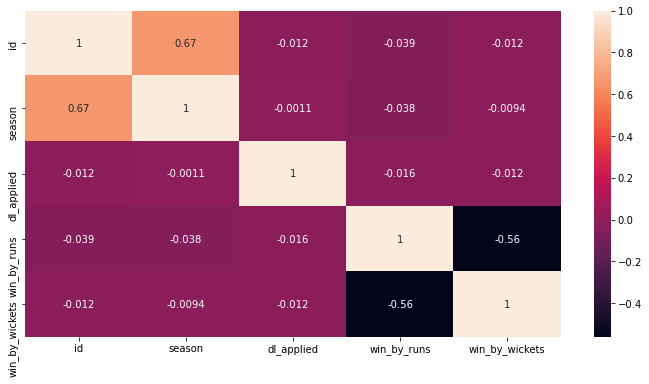

In [13]:
plt.figure(figsize=(12,6))
sns.heatmap(matches_df.corr(),annot=True)

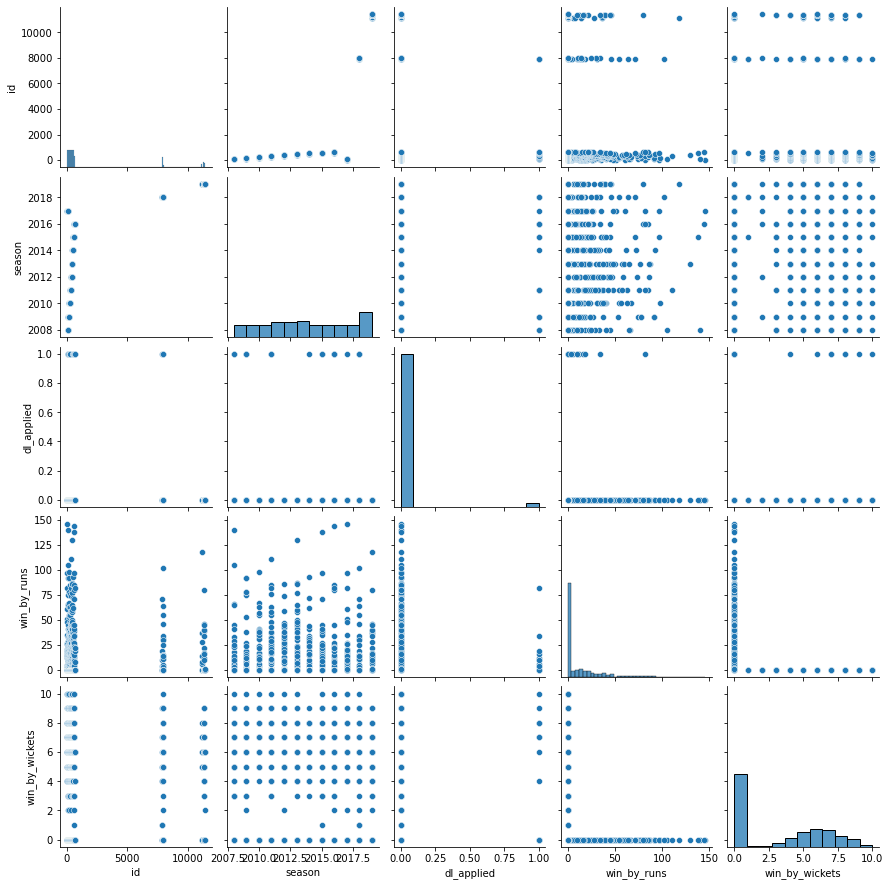

In [14]:
sns.pairplot(matches_df, palette = sns.color_palette('Paired'))

### Creating a functin for annotating bars in a bargraph

In [15]:
# create a function for labeling #
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2., 1.02*height,
                '%d' % int(height),
                ha='center', va='bottom')

### PLotting winners every match in a season

Text(0.5, 1.0, 'Runs Obtained By the winning Team')

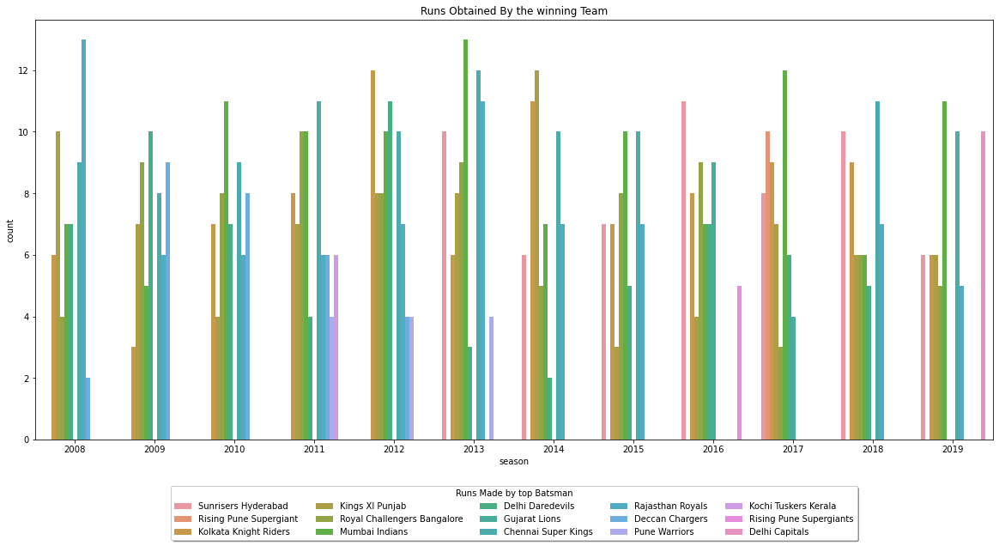

In [16]:
plt.figure(figsize=(20,9))
sns.countplot(data=matches_df, x='season', hue='winner')
plt.legend(title = 'Runs Made by top Batsman',loc='upper center',
           bbox_to_anchor=(0.5, -0.1),
          fancybox=True, shadow=True, ncol=5)
plt.title('Runs Obtained By the winning Team')

### Highest of runs in a season

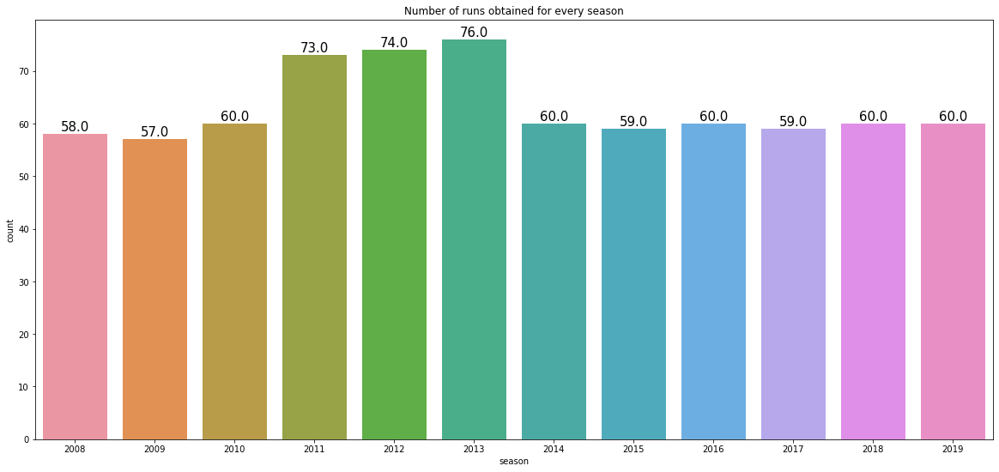

In [17]:
plt.figure(figsize=(20,9))
a = sns.countplot(data=matches_df, x='season')
plt.title('Number of runs obtained for every season')
for bar in a.patches:
    a.annotate(format(bar.get_height(),'.1f'), (bar.get_x() + bar.get_width() /2, bar.get_height()),
                      va='center', ha='center',size=15, xytext=(0, 8),
                      textcoords='offset points')


### Finding the highest win by runs and win by wickets using groupby function

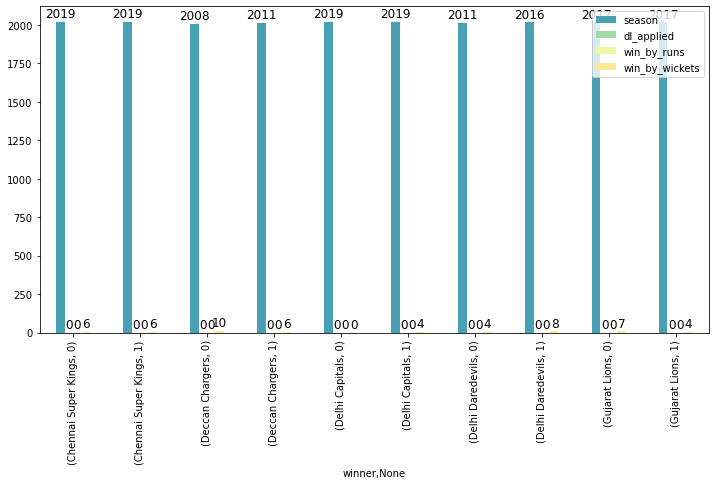

In [18]:
df_= matches_df.groupby(['winner']).apply(lambda x : x.sort_values(by = 'win_by_runs').head(2).reset_index(drop = True))
df_ = df_.iloc[:10,1:]
axx=df_.plot.bar(color=sns.color_palette('Spectral_r'),figsize=(12,6))
plt.legend()
for bar in axx.patches:
    axx.annotate(format(bar.get_height(),'.0f'), (bar.get_x() + bar.get_width() /2, bar.get_height()),
                      va='center', ha='center',size=12, xytext=(0, 8),
                      textcoords='offset points')


### Total number of wins determined

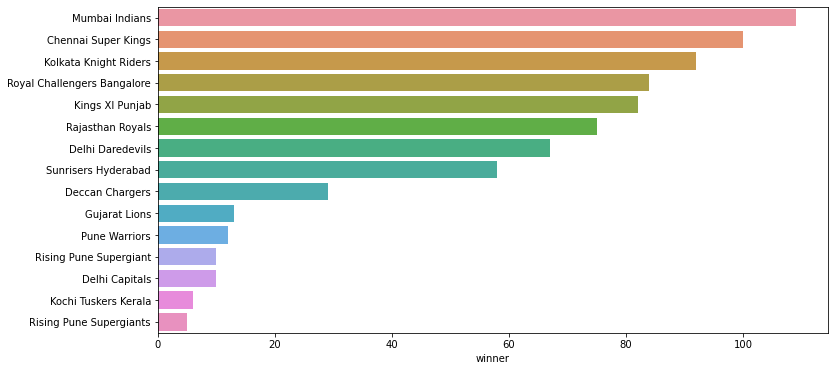

In [19]:
plt.figure(figsize=(12,6))
data = matches_df.winner.value_counts()
sns.barplot(y = data.index, x = data)
plt.show()


## Mumbai Indians has the highest number of wins

### Determining highest number of wins by wickets, wins by runs

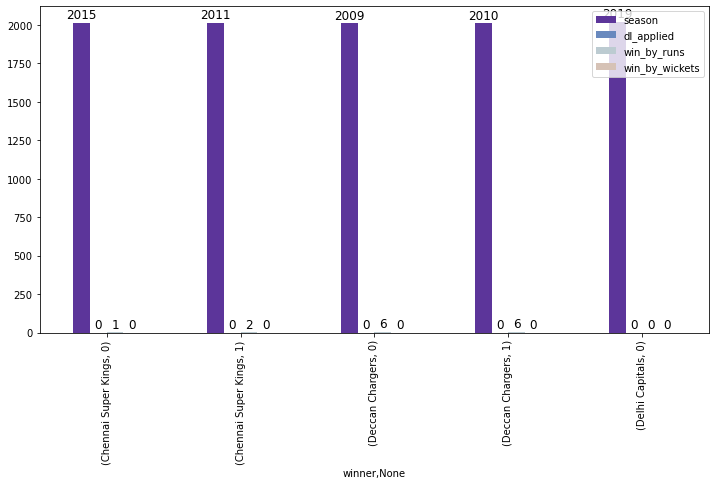

In [20]:
df_= matches_df.groupby('winner').apply(lambda x : x.sort_values(by = ['win_by_wickets','win_by_runs']).head(2).reset_index(drop = True))
df_ = df_.iloc[:5,1:]
axx=df_.plot.bar(color=sns.color_palette('twilight_shifted'),figsize=(12,6))
#annotate using matplotlib
for bar in axx.patches:
    axx.annotate(format(bar.get_height(),'.0f'), (bar.get_x() + bar.get_width() /2, bar.get_height()),
                      va='center', ha='center',size=12, xytext=(0, 8),
                      textcoords='offset points')

## Highest dl applied  is to Deccan Charges

### Determining Winners through runs by idxman()

In [21]:
wn = matches_df.iloc[matches_df['win_by_runs'].idxmax()]['winner']
print(wn)

Mumbai Indians


## Winners by runs : Mumbai Indians

### Determining Winners through wicket runs by idxman()

In [22]:
ws = matches_df.iloc[matches_df['win_by_wickets'].idxmax()]['winner']
print(ws)

Kolkata Knight Riders


## Winners by Wicket runs : Kolkata knight Riders


### Frequently used Venue

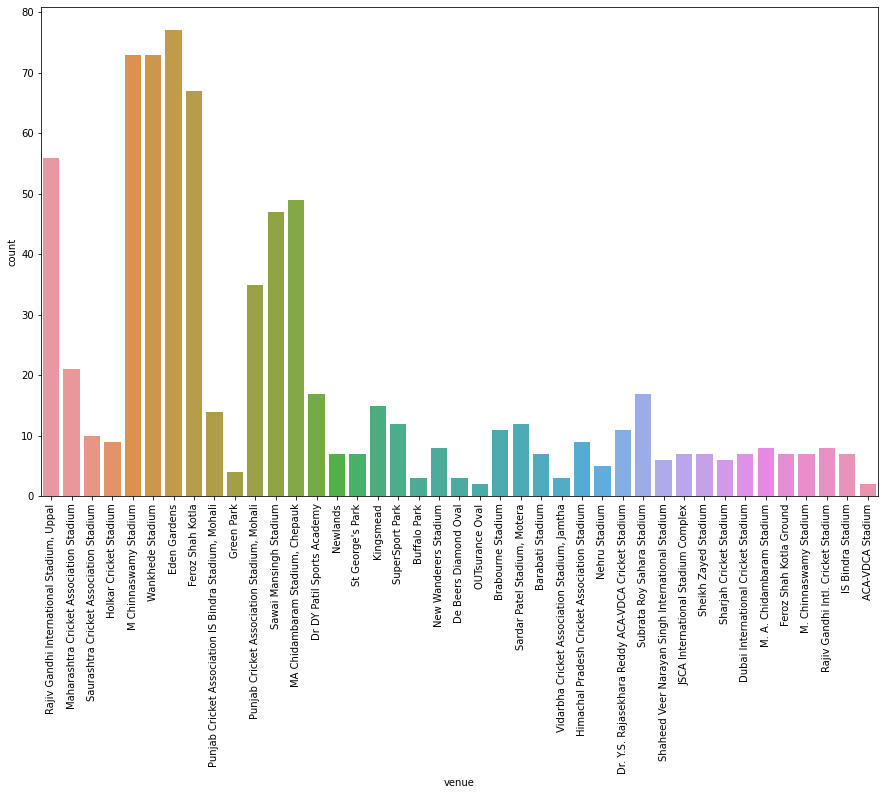

In [23]:
plt.figure(figsize=(15,9))
sns.countplot('venue', data=matches_df)
plt.xticks(rotation=90)
plt.show()

### Top player Entitled as player of the match

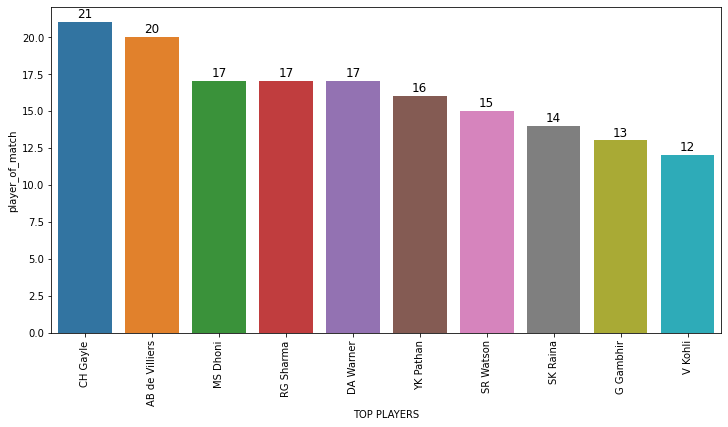

In [24]:
tp =matches_df.player_of_match.value_counts()[:10]
plt.figure(figsize=(12,6))
fg = sns.barplot(x=tp.index, y=tp)
plt.xticks(rotation=90)
plt.xlabel('TOP PLAYERS')
for bar in fg.patches:
    fg.annotate(format(bar.get_height(),'.0f'), (bar.get_x() + bar.get_width() /2, bar.get_height()),
                      va='center', ha='center',size=12, xytext=(0, 8),
                      textcoords='offset points')
plt.show()

## Top Player is CH Gayle

### Result of the match every season

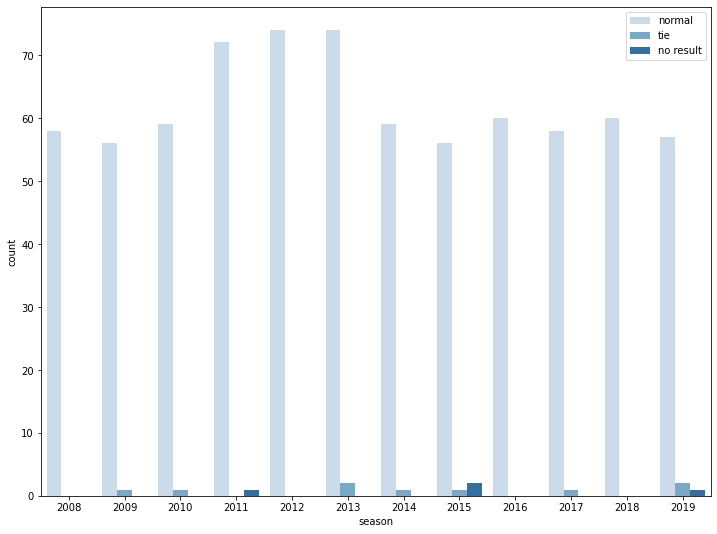

In [25]:
plt.figure(figsize=(12,9))
sns.countplot(data=matches_df,x='season', hue='result',palette="Blues")
for bar in fg.patches:
    fg.annotate(format(bar.get_height(),'.0f'), (bar.get_x() + bar.get_width() /2, bar.get_height()),
                      va='center', ha='center',size=12, xytext=(0, 8),
                      textcoords='offset points')
plt.legend()
plt.show()

### Toss Decision Every season

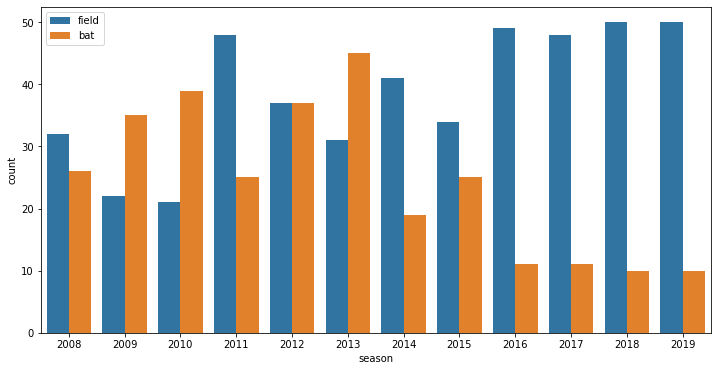

In [26]:
plt.figure(figsize=(12,6))
sns.countplot(data=matches_df,x='season', hue='toss_decision')
for bar in fg.patches:
    fg.annotate(format(bar.get_height(),'.0f'), (bar.get_x() + bar.get_width() /2, bar.get_height()),
                      va='center', ha='center',size=12, xytext=(0, 8),
                      textcoords='offset points')
plt.legend()
plt.show()

## Top decision being field is highest compared to batting

### data visualization on delivers dataset

<AxesSubplot:>

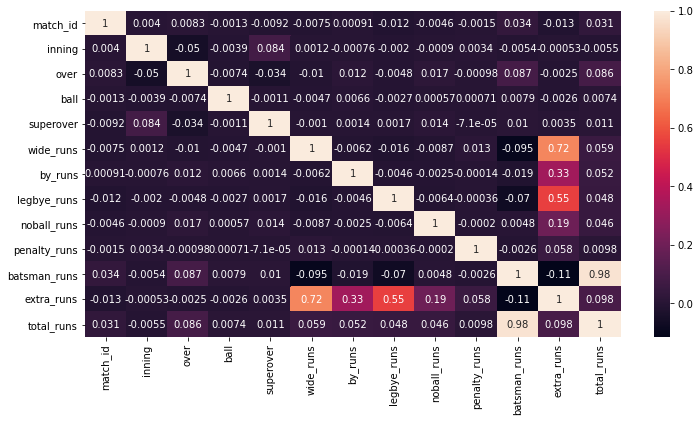

In [27]:
plt.figure(figsize=(12,6))
sns.heatmap(df1.corr(),annot=True)

### Top umpire among the umpires

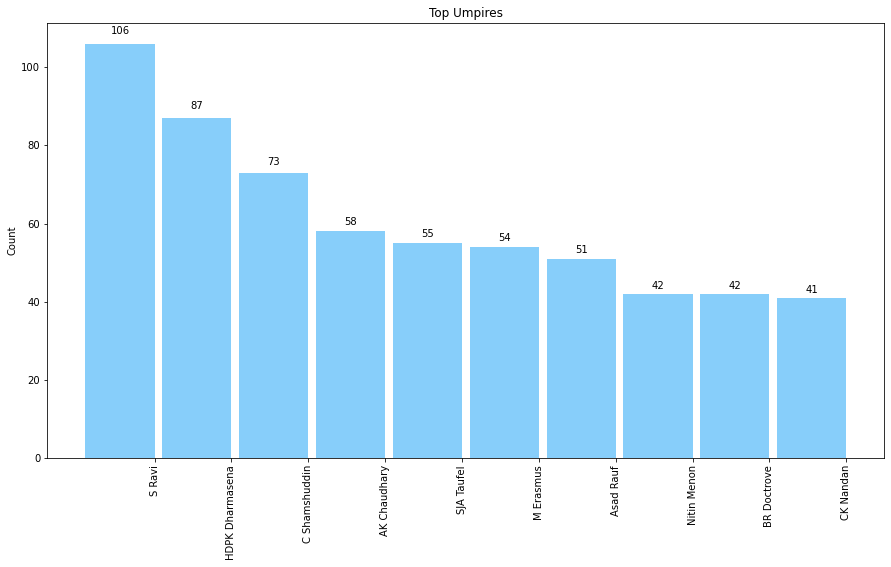

In [28]:
temp_df = pd.melt(matches_df, id_vars=['id'], value_vars=['umpire1', 'umpire2'])

temp_series = temp_df.value.value_counts()[:10]
labels = np.array(temp_series.index)
ind = np.arange(len(labels))
width = 0.9
fig, ax = plt.subplots(figsize=(15,8))
rects = ax.bar(ind, np.array(temp_series), width=width,color='lightskyblue')
ax.set_xticks(ind+((width)/2.))
ax.set_xticklabels(labels, rotation='vertical')
ax.set_ylabel("Count")
ax.set_title("Top Umpires")
autolabel(rects)
plt.show()

In [29]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 179078 entries, 0 to 179077
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   match_id          179078 non-null  int64 
 1   inning            179078 non-null  int64 
 2   batting_team      179078 non-null  object
 3   bowling_team      179078 non-null  object
 4   over              179078 non-null  int64 
 5   ball              179078 non-null  int64 
 6   batsman           179078 non-null  object
 7   non_striker       179078 non-null  object
 8   bowler            179078 non-null  object
 9   superover         179078 non-null  int64 
 10  wide_runs         179078 non-null  int64 
 11  by_runs           179078 non-null  int64 
 12  legbye_runs       179078 non-null  int64 
 13  noball_runs       179078 non-null  int64 
 14  penalty_runs      179078 non-null  int64 
 15  batsman_runs      179078 non-null  int64 
 16  extra_runs        179078 non-null  int

In [30]:
df1.describe()

,match_id,inning,over,ball,superover,wide_runs,by_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs
count,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000,179078.000000
mean,1802.252957,1.482952,10.162488,3.615587,0.000452,0.036721,0.004936,0.021136,0.004183,0.000056,1.246864,0.067032,1.313897
std,3472.322805,0.502074,5.677684,1.806966,0.021263,0.251161,0.116480,0.194908,0.070492,0.016709,1.608270,0.342553,1.605422
min,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,190.000000,1.000000,5.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,379.000000,1.000000,10.000000,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
75%,567.000000,2.000000,15.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
max,11415.000000,5.000000,20.000000,9.000000,1.000000,5.000000,4.000000,5.000000,5.000000,5.000000,7.000000,7.000000,10.000000


In [31]:
df1.isnull().sum()

match_id                 0
inning                   0
batting_team             0
bowling_team             0
over                     0
ball                     0
batsman                  0
non_striker              0
bowler                   0
superover                0
wide_runs                0
by_runs                  0
legbye_runs              0
noball_runs              0
penalty_runs             0
batsman_runs             0
extra_runs               0
total_runs               0
player_dismissed    170244
dismissal_kind      170244
fielder             172630
dtype: int64

In [32]:
df1['match_id'].nunique()

756

In [33]:
df1.shape

(179078, 21)

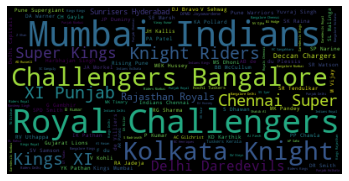

In [34]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
text = open('deliveries.csv').read()
wordcloud = WordCloud().generate(text)
# Generate plot
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [35]:
batsman = df1.groupby(['batsman'])

### plotting number of runs made by a batsman

<Figure size 2160x1080 with 0 Axes>

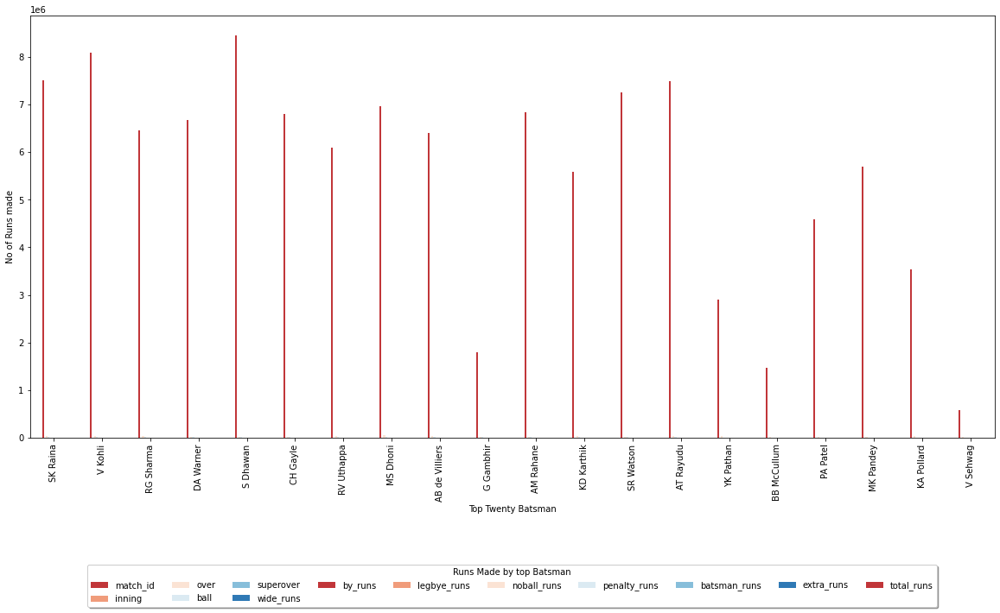

In [36]:
plt.figure(figsize=(30,15))
ax= batsman.sum().sort_values(by="total_runs",ascending=False)[:20].plot.bar(
    color= sns.color_palette('RdBu'), figsize = (20,9))
plt.xlabel('Top Twenty Batsman')
plt.ylabel('No of Runs made')
plt.legend(title = 'Runs Made by top Batsman',loc='upper center',
           bbox_to_anchor=(0.5, -0.29),
          fancybox=True, shadow=True, ncol=10)

  
plt.show()

### Plotting scores obtained using barplot

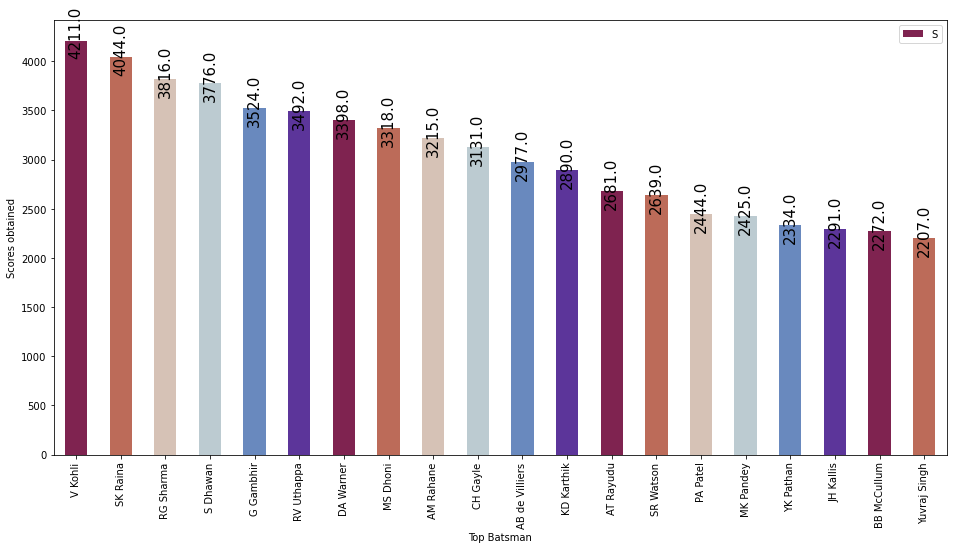

In [37]:
plt.figure(figsize= (16,8))
ax = batsman.size().sort_values(ascending=False)[:20].plot.bar(color = sns.color_palette('twilight_shifted_r'))
for i in ax.patches:
     ax.annotate(format(i.get_height(), '.1f'), 
                   (i.get_x() +i.get_width() / 2, 
                    i.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points', rotation = 90)
plt.xticks(rotation = 90)
plt.xlabel('Top Batsman')
plt.ylabel('Scores obtained')
plt.legend('Scored by the Batsman')


### Plotting a crosstab between batting team and Total runs obtained with stacked bars

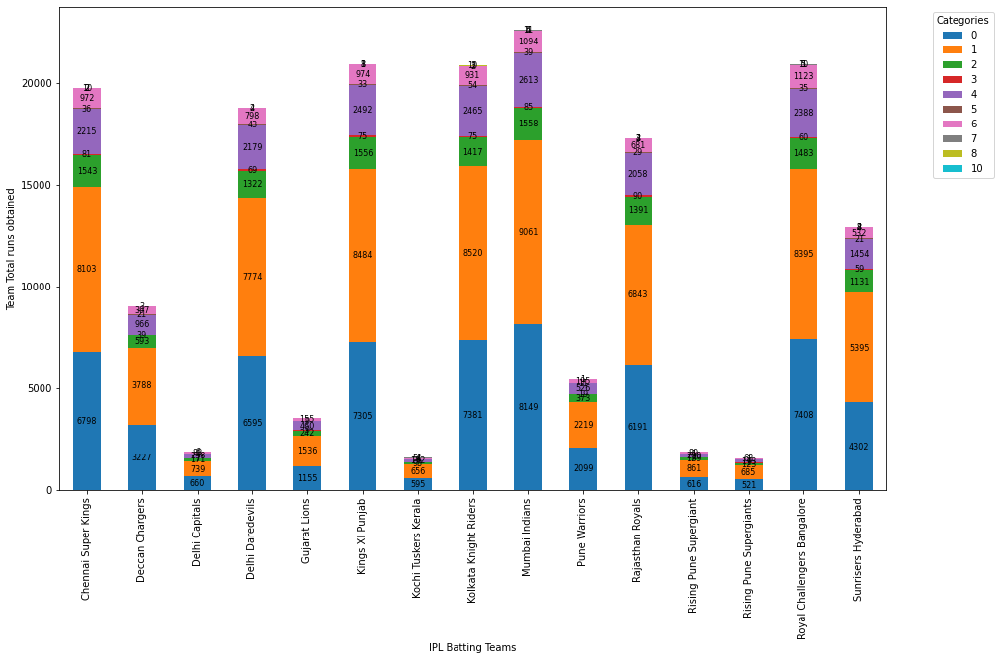

In [38]:
#plt.figure(figsize=(20,9))
ax= pd.crosstab(df1.batting_team,df1.total_runs).plot.bar(stacked=True,figsize = (15,9))
for i, rect in enumerate(ax.patches):
     #Find where everything is located
    height = rect.get_height()
    width = rect.get_width()
    x = rect.get_x()
    y = rect.get_y()

    # The height of the bar is the count value and can used as the label
    label_text = f'{height:.0f}'


    label_x = x + width / 2
    label_y = y + height / 2

    # don't include label if it's equivalently 0
    if height > 0.01:
        ax.text(label_x, label_y, label_text, ha='center', va='center', fontsize=8)
    
plt.xlabel('IPL Batting Teams')
plt.ylabel('Team Total runs obtained')
plt.legend(title='Categories', bbox_to_anchor=(1.05, 1), loc='upper left')



#(for p in ax.patches:
#    width, height = p.get_width(), p.get_height()
 #   x, y = p.get_xy() 
 #   ax.bar_label(p, label_type='center')
 #   ax.text(x+width/2, 
 #           y+height/2, 
 #           '{:.0f} %'.format(height), 
 #           horizontalalignment='center', 
 #           verticalalignment='center',label_type = 'center'))
   

In [39]:
#obtaining the columns names of the dataframe df1
df1.columns

Index(['match_id', 'inning', 'batting_team', 'bowling_team', 'over', 'ball',
       'batsman', 'non_striker', 'bowler', 'superover', 'wide_runs', 'by_runs',
       'legbye_runs', 'noball_runs', 'penalty_runs', 'batsman_runs',
       'extra_runs', 'total_runs', 'player_dismissed', 'dismissal_kind',
       'fielder'],
      dtype='object')

In [40]:
#checking for any null values in the features
df1.isnull().sum()

match_id                 0
inning                   0
batting_team             0
bowling_team             0
over                     0
ball                     0
batsman                  0
non_striker              0
bowler                   0
superover                0
wide_runs                0
by_runs                  0
legbye_runs              0
noball_runs              0
penalty_runs             0
batsman_runs             0
extra_runs               0
total_runs               0
player_dismissed    170244
dismissal_kind      170244
fielder             172630
dtype: int64

### Plotting a bar plot for a particular batsman with  and without super over 

In [41]:
batting = df1.groupby('batting_team')['superover'].value_counts()[:20]

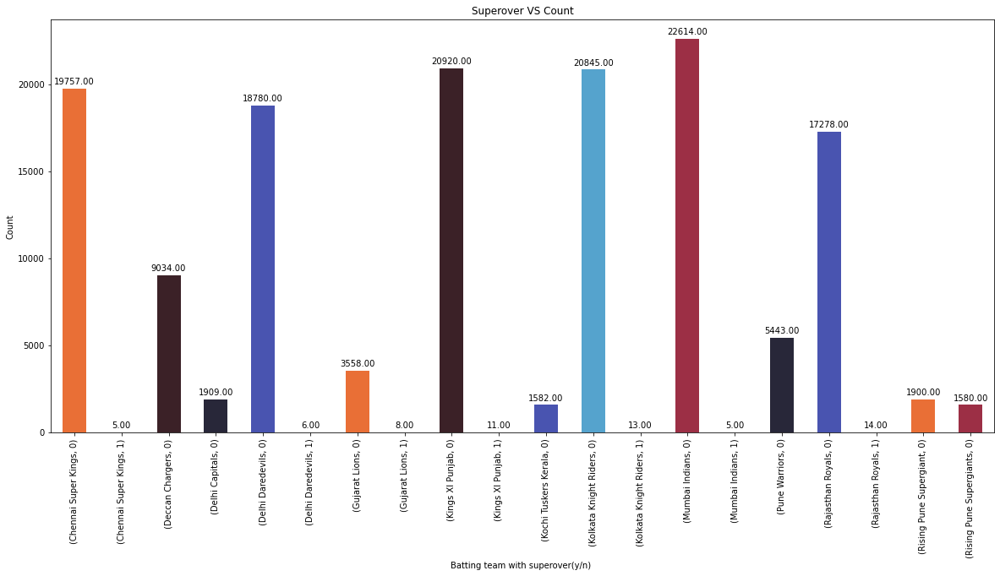

In [42]:
an = batting.plot.bar(color = sns.color_palette('icefire_r'), figsize = (20,9))
plt.xlabel('Batting team with superover(y/n) ')
plt.ylabel('Count')
plt.title('Superover VS Count')
for bar in an.patches:
    an.annotate(format(bar.get_height(), '.2f'), 
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),
                   textcoords='offset points')
plt.show()

### Runs obtained from no ball

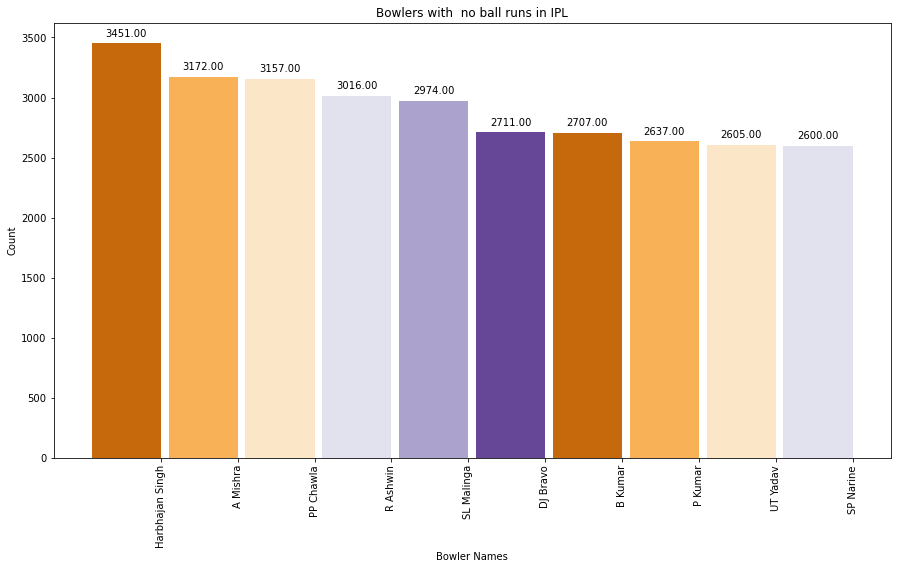

In [43]:
temp_df = df1.groupby('bowler')['noball_runs'].agg('count').reset_index().sort_values(by='noball_runs', ascending=False).reset_index(drop=True)
temp_df = temp_df.iloc[:10,:]
labels = np.array(temp_df['bowler'])
ind = np.arange(len(labels))
width = 0.9
fig, ax = plt.subplots(figsize=(15,8))
ax.bar(ind, np.array(temp_df['noball_runs']), width=width, color=sns.color_palette('PuOr'))
ax.set_xticks(ind+((width)/2.))
ax.set_xticklabels(labels, rotation='vertical')
ax.set_ylabel("Count")
ax.set_title("Bowlers with  no ball runs in IPL")
ax.set_xlabel('Bowler Names')
for i in ax.patches:
    ax.annotate(format(i.get_height(), '.2f'), (i.get_x() + i.get_width() /2, i.get_height()),
                ha = 'center', va='center',size =10, xytext=(0, 10),  textcoords='offset points')
plt.show()

### Count of penality runs of balls per Bowler using matplotlib annotation

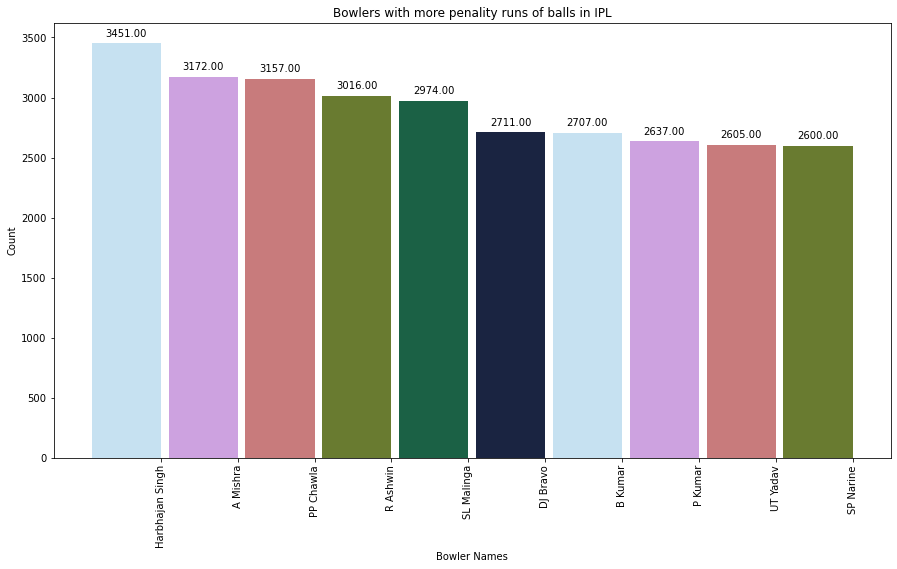

In [44]:
temp_df = df1.groupby('bowler')['penalty_runs'].agg('count').reset_index().sort_values(by='penalty_runs', ascending=False).reset_index(drop=True)
temp_df = temp_df.iloc[:10,:]
labels = np.array(temp_df['bowler'])
ind = np.arange(len(labels))
width = 0.9
fig, ax = plt.subplots(figsize=(15,8))
ax.bar(ind, np.array(temp_df['penalty_runs']), width=width, color=sns.color_palette('cubehelix_r'))
ax.set_xticks(ind+((width)/2.))
ax.set_xticklabels(labels, rotation='vertical')
ax.set_ylabel("Count")
ax.set_title("Bowlers with more penality runs of balls in IPL")
ax.set_xlabel('Bowler Names')
for i in ax.patches:
    ax.annotate(format(i.get_height(), '.2f'), (i.get_x() + i.get_width() /2, i.get_height()),
                ha = 'center', va='center',size =10, xytext=(0, 10),  textcoords='offset points')
plt.show()

### Finding the no ball  runs obtained when an x bowler is bowling

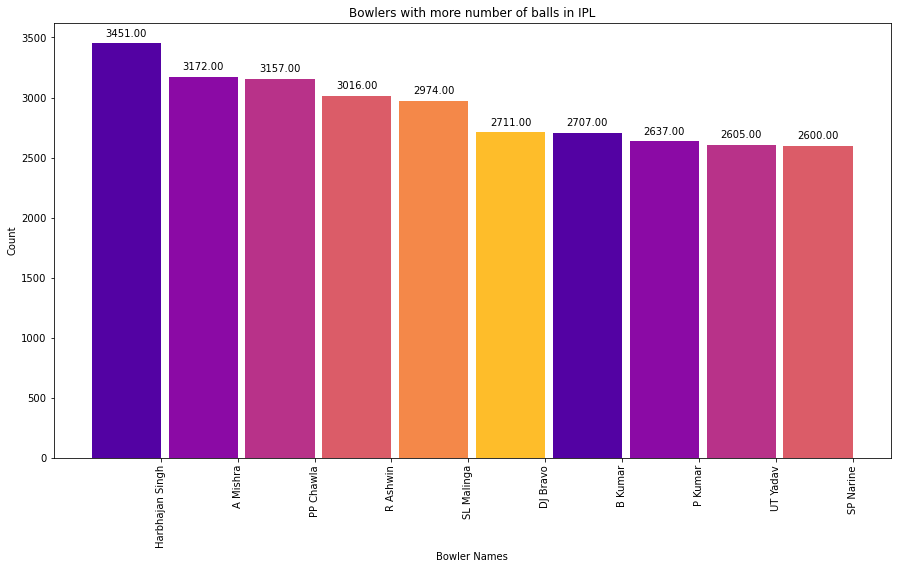

In [45]:
#er = df1groupby('batting_team')['']
temp_df = df1.groupby('bowler')['ball'].agg('count').reset_index().sort_values(by='ball', ascending=False).reset_index(drop=True)
temp_df = temp_df.iloc[:10,:]
labels = np.array(temp_df['bowler'])
ind = np.arange(len(labels))
width = 0.9
fig, ax = plt.subplots(figsize=(15,8))
ax.bar(ind, np.array(temp_df['ball']), width=width, color=sns.color_palette('plasma'))
ax.set_xticks(ind+((width)/2.))
ax.set_xticklabels(labels, rotation='vertical')
ax.set_ylabel("Count")
ax.set_title("Bowlers with more number of balls in IPL")
ax.set_xlabel('Bowler Names')
for i in ax.patches:
    ax.annotate(format(i.get_height(), '.2f'), (i.get_x() + i.get_width() /2, i.get_height()),
                ha = 'center', va='center',size =10, xytext=(0, 10),  textcoords='offset points')
plt.show()

### Countplot to plot number of times a player got  dismissed

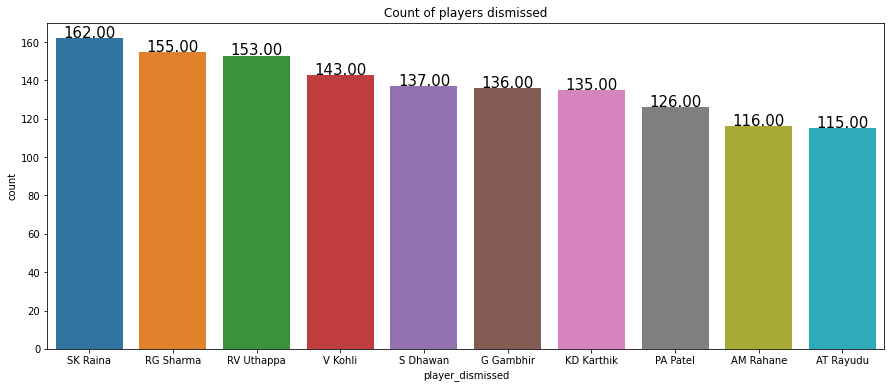

In [46]:
plt.figure(figsize=(15,6))
ax = sns.countplot(data=df1, x='player_dismissed', order = df1.player_dismissed.value_counts().iloc[:10].index)
plt.title('Count of players dismissed')
for i in ax.patches:
    ax.annotate(format(i.get_height() , '.2f'),(i.get_x()+ i.get_width()/2,i.get_height()),
                       ha = 'center', va = 'center',size=15, xytext=(0, 5),
                   textcoords='offset points')

### Count of  number of times a player  was a  fielders  

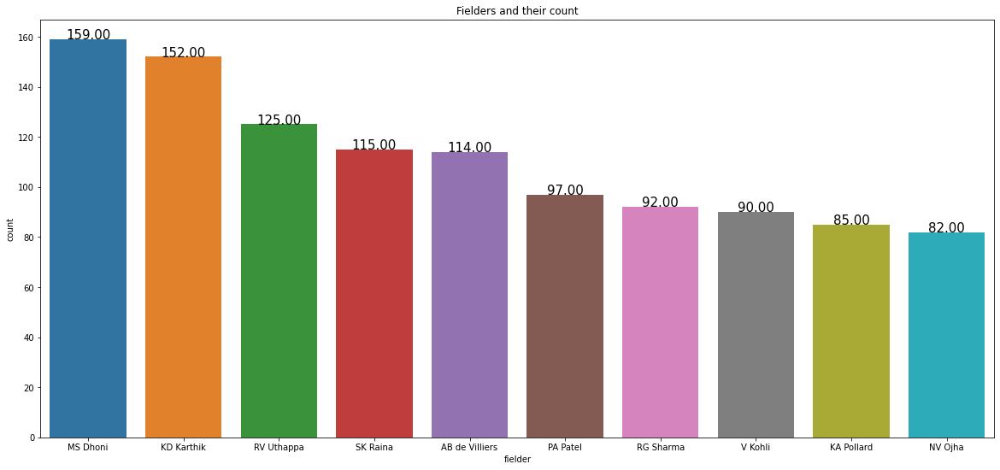

In [47]:
plt.figure(figsize=  (20,9))

ax = sns.countplot(data=df1,x='fielder', order =df1.fielder.value_counts().iloc[:10].index)
plt.title('Fielders and their count')
for i in ax.patches:
    ax.annotate(format(i.get_height() , '.2f'),(i.get_x()+ i.get_width()/2,i.get_height()),
                       ha = 'center', va = 'center',size=15, xytext=(0, 5),
                   textcoords='offset points')

### Count of non strikers

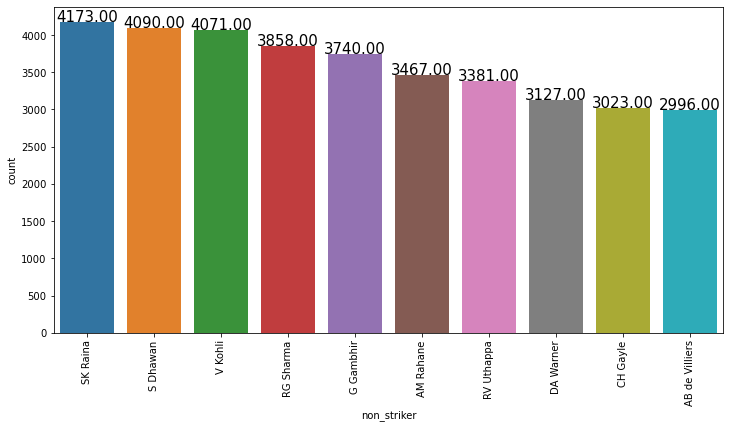

In [48]:

plt.figure(figsize=(12,6))
rects = sns.countplot(data=df1,x='non_striker',order = df1.non_striker.value_counts().iloc[:10].index)
plt.xticks(rotation = 90)
plt.title('')
for i in rects.patches:
    rects.annotate(format(i.get_height() , '.2f'),(i.get_x()+ i.get_width()/2,i.get_height()),
                       ha = 'center', va = 'center',size=15, xytext=(0, 5),
                   textcoords='offset points')

### Count plot for dismissal kind

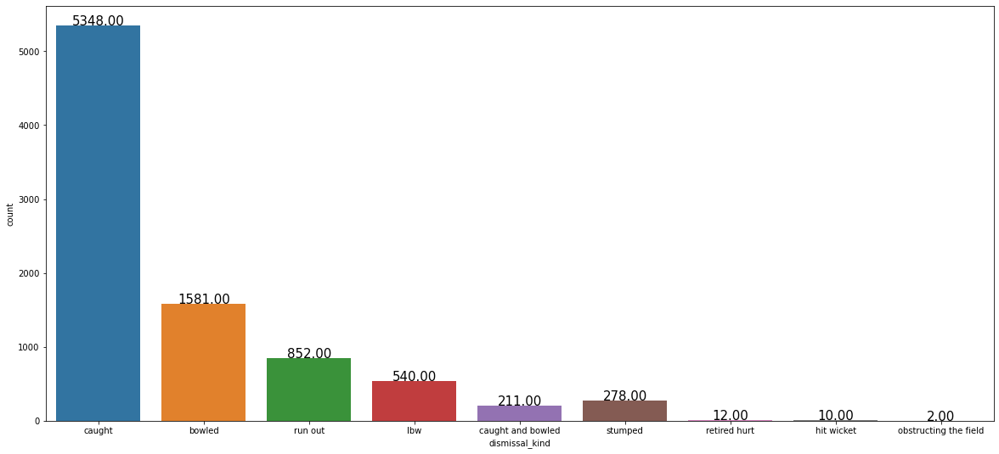

In [49]:
plt.figure(figsize=(20,9))
ax = sns.countplot(data=df1,x='dismissal_kind')
for i in ax.patches:
    ax.annotate(format(i.get_height() , '.2f'),(i.get_x()+ i.get_width()/2,i.get_height()),
                       ha = 'center', va = 'center',size=15, xytext=(0, 5),
                   textcoords='offset points')

### A gcf plot obtained for different batsman

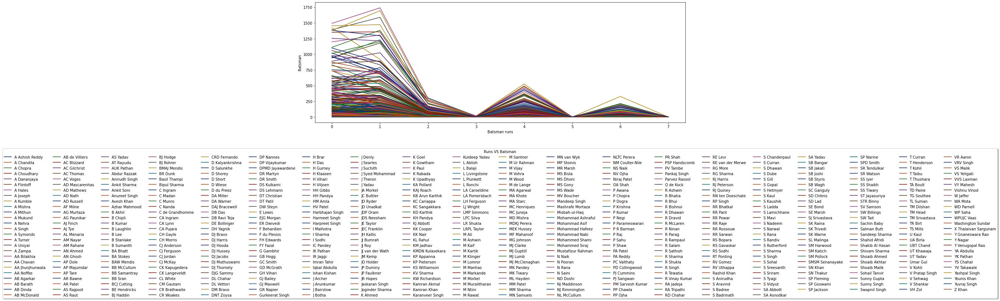

In [50]:
# GCF plot using batsman scores and batsman 
from matplotlib.font_manager import FontProperties
fontP = FontProperties()
fontP.set_size('xx-small')
df_c=pd.crosstab(df1.batsman_runs,df1.batsman)
df_c.plot(color = sns.color_palette("dark",12))
fig = plt.gcf()
fig.set_size_inches(18,6)
plt.legend(title = 'Runs VS Batsman',loc='upper center', bbox_to_anchor=(0.5, -0.2),
          fancybox=True, shadow=True, ncol=20)

#plt.grid()
plt.xlabel('Batsman runs')
plt.ylabel('Batsman')
plt.show()


### Using plotly obtaining wide runs and runs by David Warner

In [51]:
import plotly.express as px
data_bts = df1[df1.batsman == 'DA Warner']
fig = px.bar(data_bts, x='by_runs', y='wide_runs',
             color='batsman_runs',
             labels={'batsman_runs':'Runs obtained by batsman'}, height=400)
fig.show()

In [52]:
df1['batting_team'].nunique()

15

### Total Runs Obtained Teamwise using plotly histogram

In [53]:
px.histogram(df1,'batting_team','total_runs', color='noball_runs')

### Batsman with highest number of sixes(helicopter) 

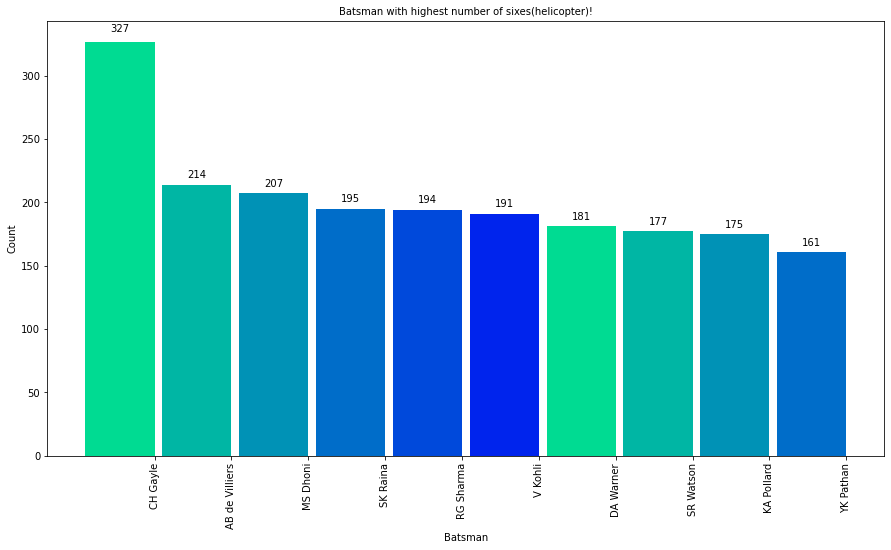

In [54]:
temp_df = df1.groupby('batsman')['batsman_runs'].agg(lambda x: (x==6).sum()).reset_index().sort_values(by='batsman_runs', ascending=False).reset_index(drop=True)
temp_df = temp_df.iloc[:10,:]

labels = np.array(temp_df['batsman'])
ind = np.arange(len(labels))
width = 0.9
fig, ax = plt.subplots(figsize=(15,8))
rects = ax.bar(ind, np.array(temp_df['batsman_runs']), width=width, color=sns.color_palette('winter_r'))
ax.set_xticks(ind+((width)/2.))
ax.set_xticklabels(labels, rotation='vertical')
ax.set_ylabel("Count")
ax.set_title("Batsman with highest number of sixes(helicopter)!",fontsize = 10)
ax.set_xlabel('Batsman')
autolabel(rects)
plt.show()


### Batsman with highest number of dotballs

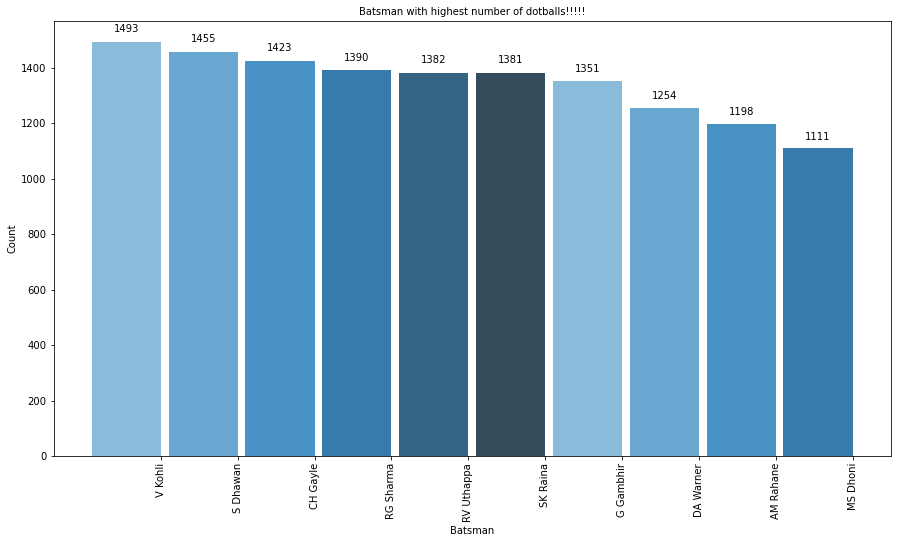

In [55]:
temp_df = df1.groupby('batsman')['batsman_runs'].agg(lambda x: (x==0).sum()).reset_index().sort_values(by='batsman_runs', ascending=False).reset_index(drop=True)
temp_df = temp_df.iloc[:10,:]

labels = np.array(temp_df['batsman'])
ind = np.arange(len(labels))
width = 0.9
fig, ax = plt.subplots(figsize=(15,8))
rects = ax.bar(ind, np.array(temp_df['batsman_runs']), width=width, color=sns.color_palette('Blues_d'))
ax.set_xticks(ind+((width)/2.))
ax.set_xticklabels(labels, rotation='vertical')
ax.set_ylabel("Count")
ax.set_title("Batsman with highest number of dotballs!!!!!",fontsize = 10)
ax.set_xlabel('Batsman')
autolabel(rects)
plt.show()

### Batsman with two runs

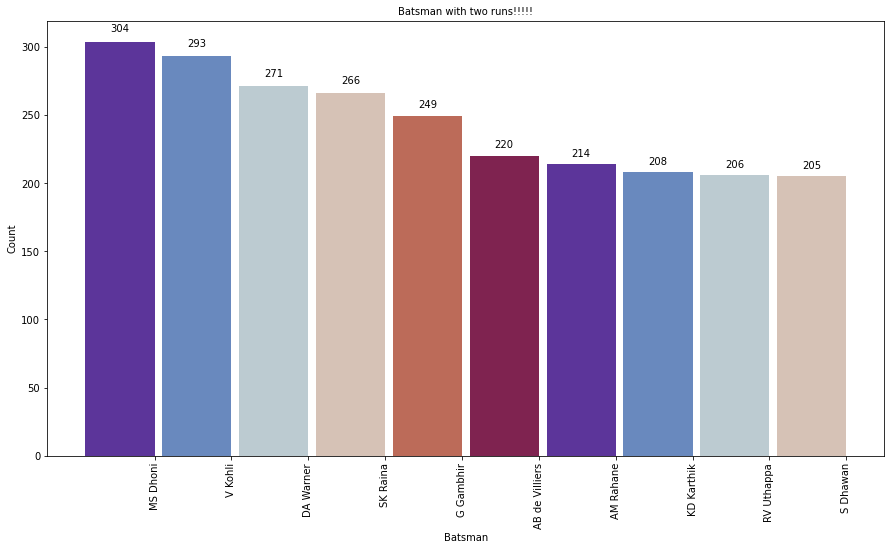

In [56]:
temp_df = df1.groupby('batsman')['batsman_runs'].agg(lambda x: (x==2).sum()).reset_index().sort_values(by='batsman_runs', ascending=False).reset_index(drop=True)
temp_df = temp_df.iloc[:10,:]

labels = np.array(temp_df['batsman'])
ind = np.arange(len(labels))
width = 0.9
fig, ax = plt.subplots(figsize=(15,8))
rects = ax.bar(ind, np.array(temp_df['batsman_runs']), width=width, color=sns.color_palette('twilight_shifted'))
ax.set_xticks(ind+((width)/2.))
ax.set_xticklabels(labels, rotation='vertical')
ax.set_ylabel("Count")
ax.set_title("Batsman with two runs!!!!!",fontsize = 10)
ax.set_xlabel('Batsman')
autolabel(rects)
plt.show()

### Batsman with highest number of boundaries

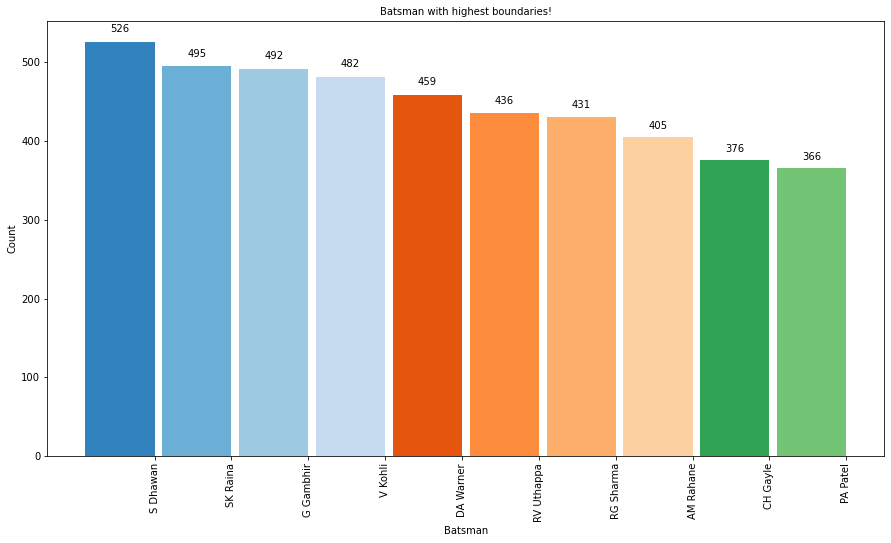

In [57]:
temp_df = df1.groupby('batsman')['batsman_runs'].agg(lambda x: (x==4).sum()).reset_index().sort_values(by='batsman_runs', ascending=False).reset_index(drop=True)
temp_df = temp_df.iloc[:10,:]

labels = np.array(temp_df['batsman'])
ind = np.arange(len(labels))
width = 0.9
fig, ax = plt.subplots(figsize=(15,8))
rects = ax.bar(ind, np.array(temp_df['batsman_runs']), width=width, color=sns.color_palette( 'tab20c'))
ax.set_xticks(ind+((width)/2.))
ax.set_xticklabels(labels, rotation='vertical')
ax.set_ylabel("Count")
ax.set_title("Batsman with highest boundaries!",fontsize = 10)
ax.set_xlabel('Batsman')
autolabel(rects)
plt.show()


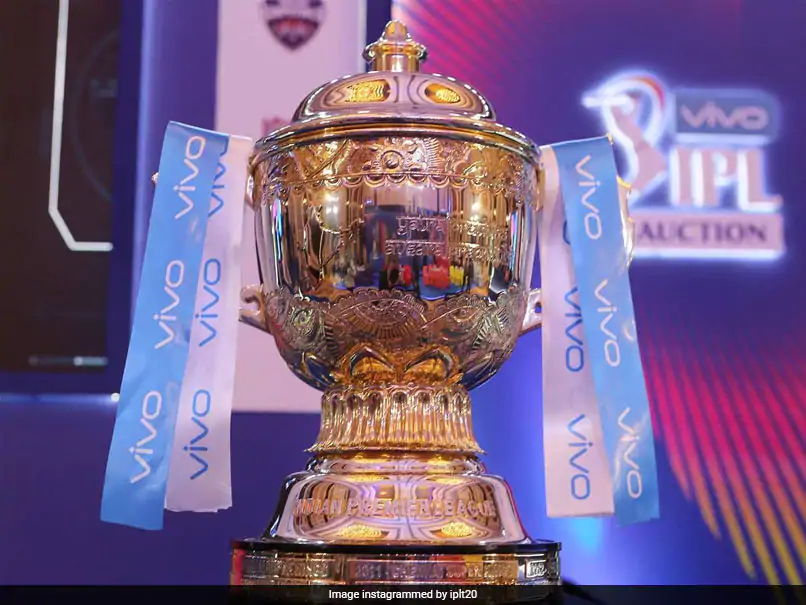

In [58]:
from IPython.display import Image
Image(filename = 'ipl.jpeg',height= 450, width =350) 

### Conclusion

### We can say Bowlers who gave the highest penality runs are 
1. Harbhajan
2. Dhawan
3. Kohli
 
### The Bowler who gave the highest number of noballs
1. Haarbhajan 
2. A Mishra
3. pp Chawla

### Total number of Superover are 7 


### Batsman with highest number of sixes
1. Gayle
2. AB de villiers
3. MS.Dhoni

### Batsman with highest number of dotballs
1. V kohli
2. S Dhawan
3. Gayle
### Batsman with Highest number of two runs
1. MS Dhoni
2. V Kohli
3. DA Warner

### Batsman with highest number of boundaries
1. S Dhawan
2. SK Raina
3. G Gambir

### Team with highest number of total runs is Mumbai Indians with highest runs of 29.599k
### highest number of wide runs is 5

### Top batsman is Virat Kohli with 4211 runs

### Thank you 